# Data Driven Dev - Linear regression

Linear regression refers to a model that assumes a linear relationship between input variables X (also called features, predictors, independent or explanatory or predictive variables) and the target variable y (called also response or dependent variable). 

Linear regresion is called **simple if we have only one explanatory variabe** and **multiple when there are several explanatory variables**. With higher dimensions, this relationship can be thought of as a hyperplane that connects the input variables to the target variable.  
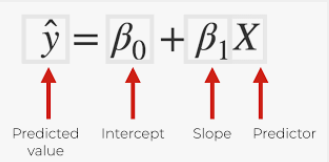  

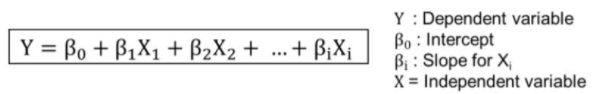  

The coefficients of the model are found via an optimization process that seeks to minimize the sum squared error (called also residuals) between the predictions (yhat) and the expected target values (y).  
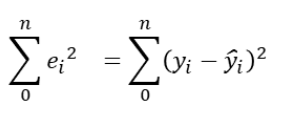  
## Main steps to build ML model  
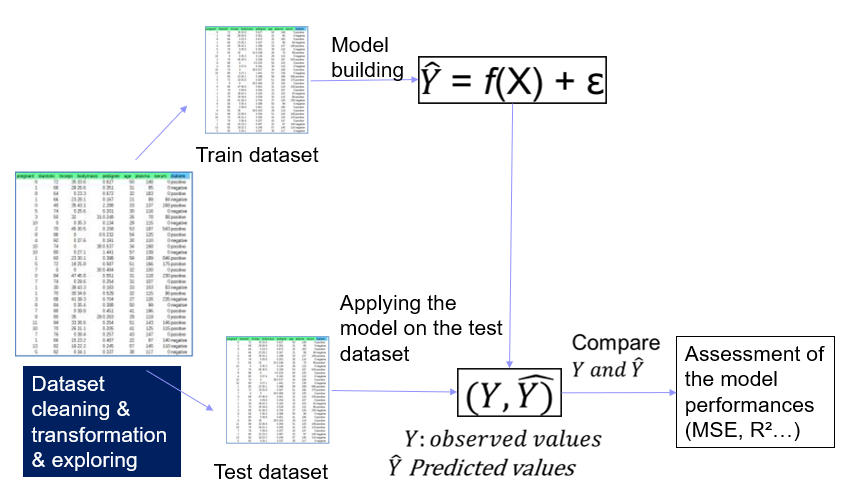

## Loading libraries

In [1]:
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import numpy
import numpy as np
import os

## Loading and describing data

In this example, we will consider the dashboard case study. We will consider the "Novelty" perception as a target variable and the design choices as features. The final aim is to help designers to identify the main features that allow to improve the novelty perception.

In [2]:
path = r"D:\Etudes\CS\3A\2_DS\6_Data Driven Design\Cours 2\TD 2"
filename = 'Dashboards_cleaned_data_TD2' + '.xlsx'
file_path = r"%s\%s" % (path, filename)

data = pd.read_excel(file_path)

In [3]:
data.head(5)

,Dashboards,Speedometer Dial position,Display lay-out,Air conditioner control,Air vent shape,Dashboard color,Aerator Shape,Arrangement space,Style lay-out,Space organization,Control comprehensibility,Aerator lay-out,Arrangement space perception,Comfort,Simplicity,Sportive lay-out,Masculinity,Quality,Novelty,Harmony
0,AUDI A2,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,1.450467,0.274412,0.508663,1.195646,0.994656,1.387392,0.935571,1.832030,1.522825,0.659925,0.621599
1,AUDI A2,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,1.494907,0.542454,0.913278,1.658658,0.878994,1.500000,0.781624,1.324876,0.934648,0.349055,0.550753
2,AUDI A2,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,1.218555,0.251733,0.508663,1.213164,0.621023,0.685520,1.102452,2.376149,1.596414,0.557546,0.782384
3,AUDI A2,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,1.582660,0.502153,0.733291,1.414931,0.759221,0.591908,0.989090,2.084871,1.062366,0.663976,0.980191
4,AUDI A2,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,1.566950,0.497169,0.666870,1.612729,1.148344,0.482612,1.067539,1.711795,1.593736,0.700000,0.980191


Now, let's have a look on the main caracteristics of the data set: dimensions, count, mean, min, max, etc. This allows to have an overall idea about the data (missing values, dispersion, distirbution...)

In [4]:
print(f'The dimension of the data is {data.shape}')

The dimension of the data is (2000, 20)


In [5]:
data.columns

Index(['Dashboards', 'Speedometer Dial position', 'Display lay-out',
       'Air conditioner control', 'Air vent shape', 'Dashboard color',
       'Aerator Shape', 'Arrangement space', 'Style lay-out',
       'Space organization', 'Control comprehensibility', 'Aerator lay-out',
       'Arrangement space perception', 'Comfort', 'Simplicity',
       'Sportive lay-out', 'Masculinity', 'Quality', 'Novelty', 'Harmony'],
      dtype='object')

Let's check if there is any missing data. As shown below, the answer is NO

In [6]:
data.isnull().values.any()

False

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 20 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Dashboards                    2000 non-null   object 
 1   Speedometer Dial position     2000 non-null   object 
 2   Display lay-out               2000 non-null   object 
 3   Air conditioner control       2000 non-null   object 
 4   Air vent shape                2000 non-null   object 
 5   Dashboard color               2000 non-null   object 
 6   Aerator Shape                 2000 non-null   object 
 7   Arrangement space             2000 non-null   object 
 8   Style lay-out                 2000 non-null   object 
 9   Space organization            2000 non-null   float64
 10  Control comprehensibility     2000 non-null   float64
 11  Aerator lay-out               2000 non-null   float64
 12  Arrangement space perception  2000 non-null   float64
 13  Com

Let's have a quick analysis of the basic statistics and check if there is any outliers (min, max, quantile...)

In [8]:
print('Data description:\n')
data.describe()

Data description:



,Space organization,Control comprehensibility,Aerator lay-out,Arrangement space perception,Comfort,Simplicity,Sportive lay-out,Masculinity,Quality,Novelty,Harmony
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,0.898374,0.913206,0.900610,0.996713,0.955681,0.978712,0.948358,0.922245,0.979715,1.138633,0.899086
std,0.338004,0.403945,0.355042,0.384170,0.261603,0.358203,0.310138,0.516643,0.308901,0.546608,0.260939
min,0.197665,0.111587,0.167909,0.359269,0.391805,0.297023,0.365789,0.144708,0.366294,0.199110,0.264765
25%,0.667290,0.589801,0.667232,0.679340,0.752706,0.703971,0.727485,0.543138,0.761250,0.680563,0.713488
50%,0.877256,0.859786,0.880104,0.918262,0.941387,0.959794,0.920509,0.805968,0.929531,0.996362,0.888472
75%,1.066409,1.215407,1.108257,1.290596,1.140056,1.196055,1.119008,1.180366,1.100000,1.555750,1.068049
max,1.796078,2.046427,1.932636,2.367078,2.400509,2.450408,2.541265,2.724929,2.051305,2.500000,1.495300


Novelty is the target variable. 

## Exploratory Data Analysis (EDA) 

In [9]:
import seaborn as sns

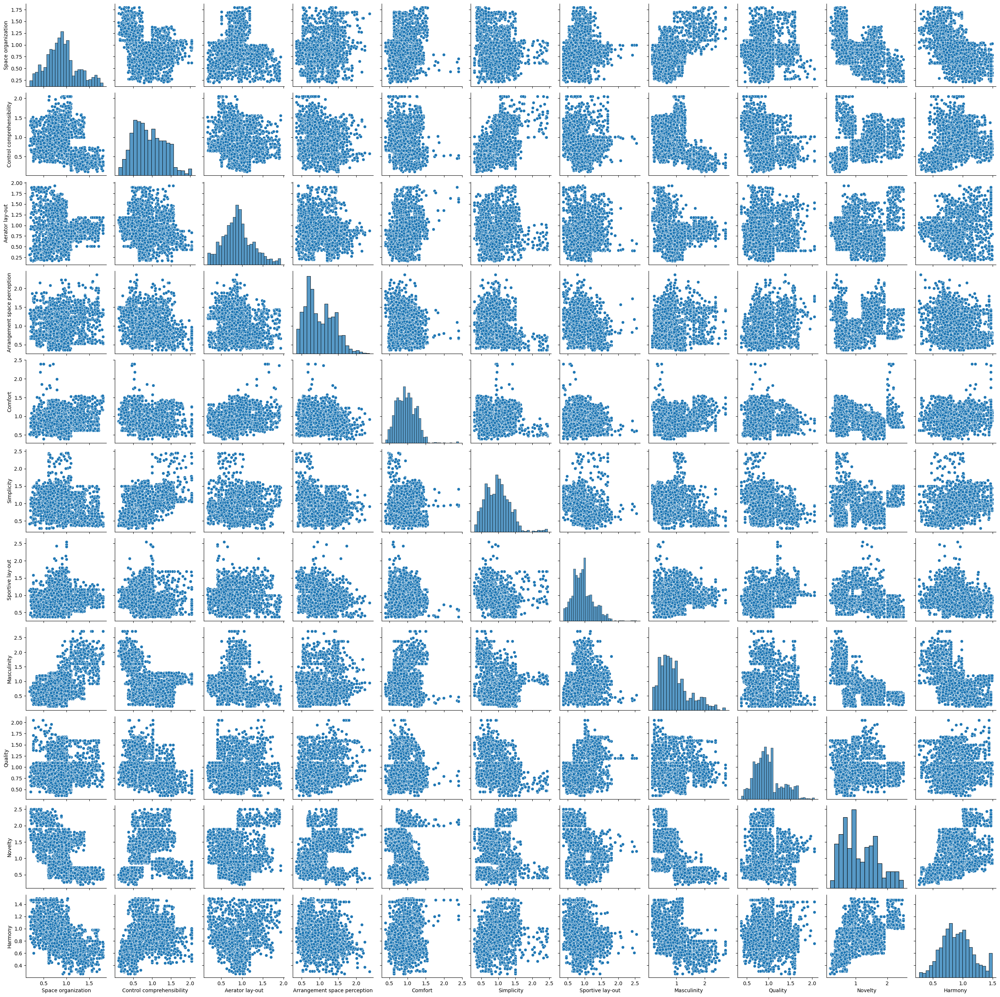

In [10]:
sns.pairplot(data)

Since the aim here is to analyse Novelty perception as a target, let's explore its distribution as well as its relationship with the other variables.

In [11]:
import hvplot.pandas
data.hvplot.scatter(x='Novelty')

:NdOverlay   [Variable]
   :Scatter   [Novelty]   (value)

Chaque valeur est représentée par un point, avec pour abscisse la valeur de la variable 'novelty' et pour ordonnée la valeur des autres variables numériques. Ainsi, si on trace une droit verticale c'est-à-dir pour une 'novelty' donnée, on croise un point de chaque couleur.
Cette représentation permet de lire le niveau de corrélation entre la variable 'novelty' et les autres.

In [12]:
data.hvplot.hist("Novelty")

:Histogram   [Novelty]   (Novelty_count)

Cet histogramme permet d'observer la répartition des valeurs prises par la variable 'Novelty' pour l'ensemble des modèles de Dashboard présents dans le dataframe.

In [13]:
data.hvplot.hist('Novelty', by='Dashboards', subplots=True, width=500)

:NdLayout   [Dashboards]
   :Histogram   [Novelty]   (Novelty_count)

Ces histogrammes permettent d'observer la répartition des valeurs pour la variable 'Novelty' en fonction des modèles de voiture. La Toyota Yaris est la mieux notée mais aussi la plus répartie en fonction des modèles de Dashboard, tandis que le VW Polo est beaucoup moins bien notée.

In [14]:
data.hvplot.scatter(y='Novelty')

:Scatter   [index]   (Novelty)

In [15]:
data.hvplot.scatter(x='Dashboards', y='Novelty')

:Scatter   [Dashboards]   (Novelty)

La figure ci-dessus présente la répartition des notations pour le critères 'Novelty' par les clients en différenciant les modèles de véhicules. La Renault Modus apparaît comme la mieux notée, et la Clio, la Polo et l'Audi A2 comme les moins bien notées.

<Axes: xlabel='Novelty', ylabel='Dashboards'>

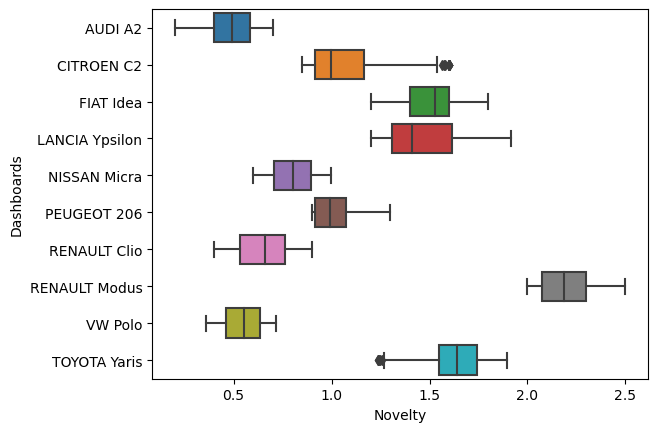

In [16]:
sns.boxplot(y='Dashboards',x='Novelty',data=data)

#### How to read a box plot/Introduction to box plots
Four equal sized groups are made from the ordered scores. That is, 25% of all scores are placed in each group. The lines dividing the groups are called quartiles, and the groups are referred to as quartile groups. Usually we label these groups 1 to 4 starting at the bottom.
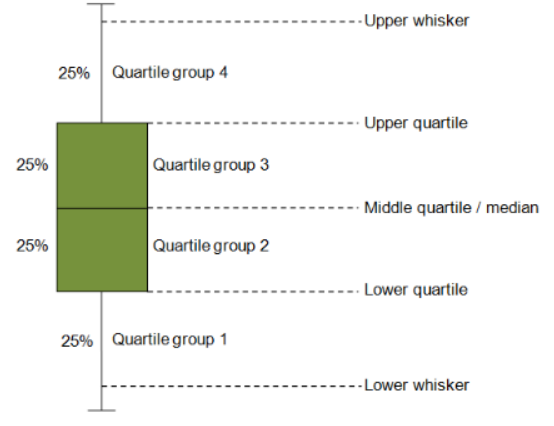

Le graphe ci-dessus permet de constater visuellement comment les notations des clients sont réparties pour un même modèle de véhicule, avec sa médiane et ses quartiles. Par exemple, pour l'Audi A2, la médiane est d'environ 0,5, avec un premier quartile à 0,15 (particulièrement distribué), et un 3e quartile à 0,7.

The graph below allows to assess the correlation between variables.

C:\Users\salom\AppData\Local\Temp\ipykernel_24816\3056385833.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True)


<Axes: >

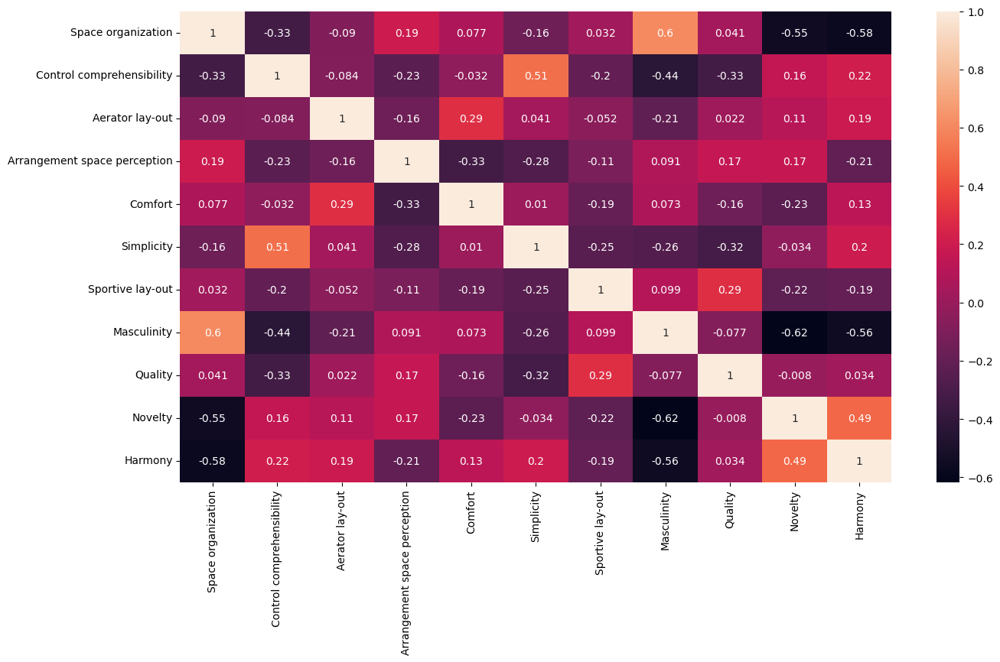

In [17]:
plt.figure(figsize = (15,8))
sns.heatmap(data.corr(), annot=True)

## Define the predictor variables xi and the target variable y

The aim he is to create a Kansei (emotional) model, which will allow us to translate human sensibility and images into physical design factorsand vice versa.
We will focus here on the Novelty as a target. then, we will consider the technical variable as predictors.  
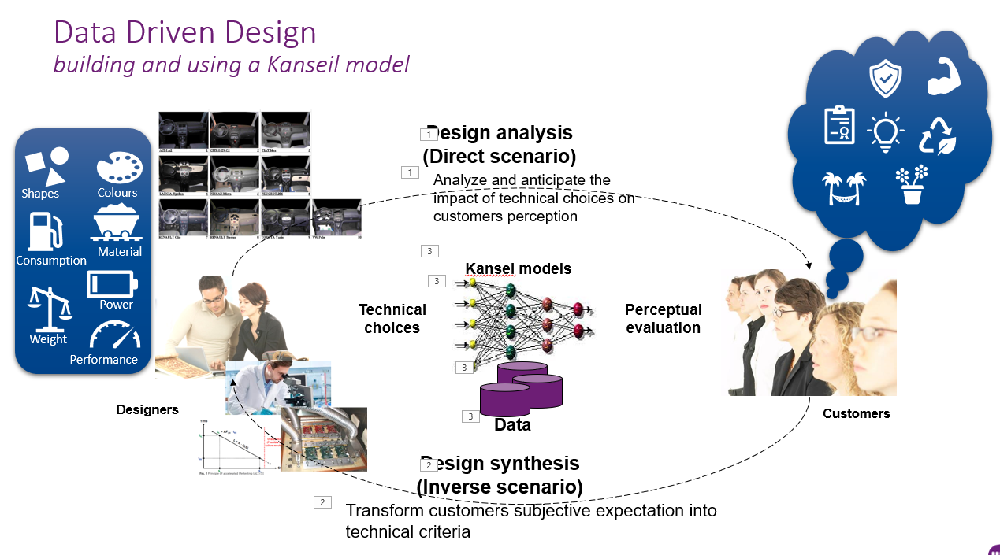

As any prediciton model, we need to define the predictor features (X) and the target value (y).
As said before, in ou case study, we will consider the technical variables are predictors and the "Novelty', which is a perceptual variable, as a target.

As said before, our goal here is to explain the 'Novelty'. In other words, to define how technical choices can influence the perception of Novelty. Such model is very helfull for designers.

In [18]:
X = data[['Speedometer Dial position', 'Display lay-out',
       'Air conditioner control', 'Air vent shape', 'Dashboard color',
       'Aerator Shape', 'Arrangement space', 'Style lay-out', 'Novelty']]
y = data['Novelty']
variables =X.columns.insert(0, 'Constant')
print(variables)
X.head(5)

Index(['Constant', 'Speedometer Dial position', 'Display lay-out',
       'Air conditioner control', 'Air vent shape', 'Dashboard color',
       'Aerator Shape', 'Arrangement space', 'Style lay-out', 'Novelty'],
      dtype='object')


,Speedometer Dial position,Display lay-out,Air conditioner control,Air vent shape,Dashboard color,Aerator Shape,Arrangement space,Style lay-out,Novelty
0,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,0.659925
1,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,0.349055
2,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,0.557546
3,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,0.663976
4,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,0.700000


## Data transformation
Since the technical variable are categorical, we need to recode them using the dummy function to be able to apply the regression model.


In [65]:
data_dummy = pd.get_dummies(data=X, drop_first=True)
data_dummy

,Speedometer Dial position_behind steering wheel,Display lay-out_digital,Air conditioner control_other,Air vent shape_square,Dashboard color_two colours,Aerator Shape_square,Arrangement space_many,Style lay-out_curved lines
0,1,0,0,1,0,1,1,0
1,1,0,0,1,0,1,1,0
2,1,0,0,1,0,1,1,0
3,1,0,0,1,0,1,1,0
4,1,0,0,1,0,1,1,0
...,...,...,...,...,...,...,...,...
1995,0,1,1,0,0,0,1,1
1996,0,1,1,0,0,0,1,1
1997,0,1,1,0,0,0,1,1
1998,0,1,1,0,0,0,1,1


On utilise le paramètre drop_first à True qui permet de réduire les dimensions du tableau en gardant le même niveau d'information dans la mesure où, pour une variable comme display layouy pouvant prendre deux valeurs 'digital' ou 'analogue', garder une seule colonne display layout_digital permet d'avoir l'information complète : si elle est à 1, alors la valeur est 'digital' ; si elle est à 0 alors la valeur est 'analogue'.

Let's define Y="Novelty" are target variable et the technical X=variables as predictors

In [20]:
Y = data_dummy['Novelty']
X = data_dummy.loc[:, data_dummy.columns != 'Novelty']
X.head(3)

,Speedometer Dial position_behind steering wheel,Display lay-out_digital,Air conditioner control_other,Air vent shape_square,Dashboard color_two colours,Aerator Shape_square,Arrangement space_many,Style lay-out_curved lines
0,1,0,0,1,0,1,1,0
1,1,0,0,1,0,1,1,0
2,1,0,0,1,0,1,1,0


## Main steps to build ML model  
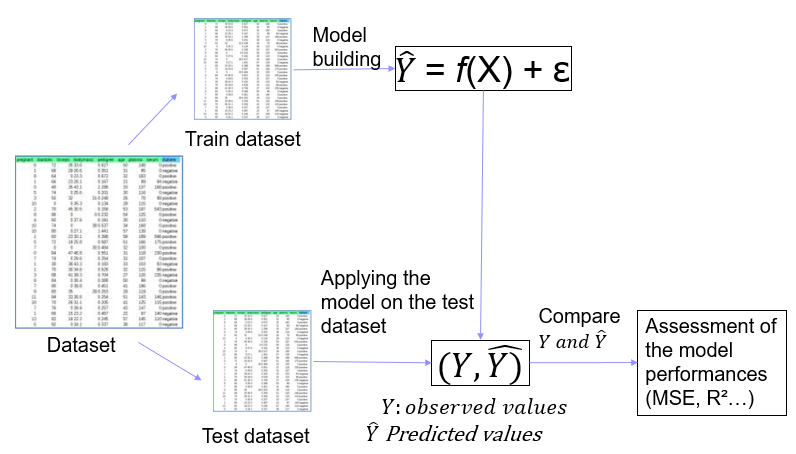

## Split the data set a train dataset and test dataset

Common rule: 70% of the data is allocated to train the model (X_train and y_train) and 30% to the model testing (X_test and y_test).

In [21]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

In [22]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1400, 8)
(600, 8)
(1400,)
(600,)


On a sélectionné au hasard dans le jeu de données existant 70% des valeurs pour entraîner le modèle et 30% des valeurs pour le tester. Elles sont comprises respectivement dans les variables (X_train,y_train) et (X_test,y_test).

In [23]:
X_test.head(3)

,Speedometer Dial position_behind steering wheel,Display lay-out_digital,Air conditioner control_other,Air vent shape_square,Dashboard color_two colours,Aerator Shape_square,Arrangement space_many,Style lay-out_curved lines
1860,0,1,1,0,0,0,1,1
353,1,1,1,0,0,0,0,1
1333,1,0,1,1,0,1,0,0


Les valeurs sont mélangées par rapport à avant.

In [24]:
X_test0 = X_test.iloc[0]
X_test0

Speedometer Dial position_behind steering wheel    0
Display lay-out_digital                            1
Air conditioner control_other                      1
Air vent shape_square                              0
Dashboard color_two colours                        0
Aerator Shape_square                               0
Arrangement space_many                             1
Style lay-out_curved lines                         1
Name: 1860, dtype: uint8

C'est la première ligne du tableau précédent qui est affichée, avec les valeurs de chacune des variables prédictives.

In [25]:
y_test.head(3)

1860    1.323296
353     0.874874
1333    0.685620
Name: Novelty, dtype: float64

In [26]:
y_test0 = y_test.iloc[0]
y_test0

1.323296456

C'est la valeur de la variable 'Novelty' (variable cible dans notre cas) corresponant aux variables prédictives X_test0.

In [27]:
print(f'The dimensions of the training data are {X_train.shape}')
print(f'The dimensions of the testing data are {X_test.shape}')

The dimensions of the training data are (1400, 8)
The dimensions of the testing data are (600, 8)


Cela représente bien respectivement 70% et 30% des données à notre disposition pour entraîner et tester notre modèle, avec 8 critères de prédiction sur la base de crtières qualitatifs transformés en critères numériques grâce à la méthode dummy abordée dans le TD1.

## Training a Linear Regression Model: Ordinary least squares Regression

OLS (Ordinary least squares Regression) is the simple linear regression model, in which you aim at predicting n observations of the response variable, y, with a linear combination of p predictor variables, X, and a normally distributed error term with variance σ²  
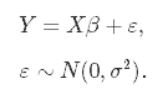  

As we don't know the true parameters, β, we have to estimate them from the sample. 

In the Ordinary Least Squares (OLS) approach, we estimate them as β^ in such a way, that sum of the squared differences between the observed values and the corresponding fitted values (called residuals) is as small as possible. In other words, we minimize the following loss function:  
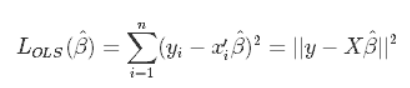  

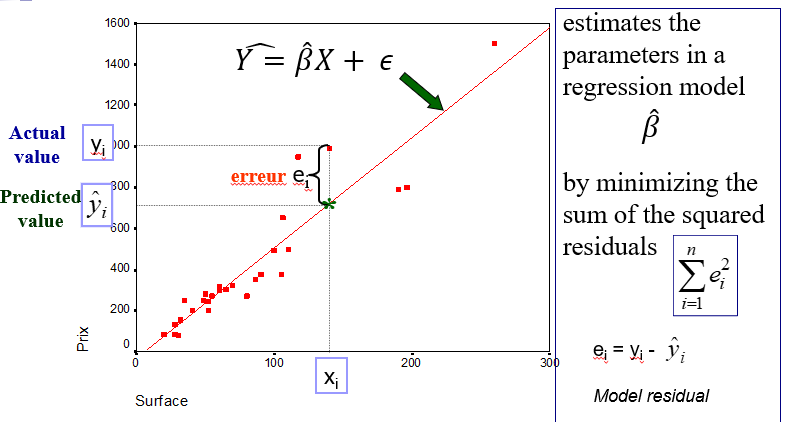

Now let's import the statsmodels library to be able to use the linear regression model

In [28]:
import statsmodels.api as sm

For the model we will use, the OLS, we need to add the percept variable (constant) to our features.

In [60]:
X_train1 = X_train
y_train1 = y_train
X_train1 = sm.add_constant(X_train1)
variables =X.columns.insert(0, 'Constant')
print(variables)
print(X_train1.shape)
X_train1.head(3)

Index(['Constant', 'Speedometer Dial position_behind steering wheel',
       'Display lay-out_digital', 'Air conditioner control_other',
       'Air vent shape_square', 'Dashboard color_two colours',
       'Aerator Shape_square', 'Arrangement space_many',
       'Style lay-out_curved lines'],
      dtype='object')
(1400, 9)


,const,Speedometer Dial position_behind steering wheel,Display lay-out_digital,Air conditioner control_other,Air vent shape_square,Dashboard color_two colours,Aerator Shape_square,Arrangement space_many,Style lay-out_curved lines
836,1.0,1,0,0,0,0,0,0,0
575,1.0,0,0,1,1,1,1,1,0
557,1.0,0,0,1,1,1,1,1,0


On initialise la perception de la nouveauté à 1. Lors de l'entraînement du modèle, cette valeur sera ajustée de sorte de minimiser l'écart entre la nouveauté effective selon la méthodes moindres carrés.

Now, it is time to fit a model to our data.

In [67]:
OLS_model = sm.OLS(y_train1,X_train1)
OLS_results = OLS_model.fit()

### Model results analysis

#### Model coefficients interpretation

In [31]:
OLS_results.params

const                                              1.604211
Speedometer Dial position_behind steering wheel   -0.789284
Display lay-out_digital                            0.482069
Air conditioner control_other                     -0.158970
Air vent shape_square                             -0.036658
Dashboard color_two colours                        0.393994
Aerator Shape_square                              -0.036658
Arrangement space_many                            -0.250511
Style lay-out_curved lines                        -0.041116
dtype: float64

In [32]:
OLS_reg_coeff = pd.DataFrame({'Coef': OLS_results.params})
OLS_reg_coeff.set_index(variables)

,Coef
Constant,1.604211
Speedometer Dial position_behind steering wheel,-0.789284
Display lay-out_digital,0.482069
Air conditioner control_other,-0.158970
Air vent shape_square,-0.036658
Dashboard color_two colours,0.393994
Aerator Shape_square,-0.036658
Arrangement space_many,-0.250511
Style lay-out_curved lines,-0.041116


* Holding all other features fixed, selecting the technical choice 'Speedometer Dial position = behind the steerng wheel, will decrease the novelty by 0.78 
* Holding all other features fixed, selecting the technical choice 'Display lay-out = digital, will decrease the novelty by 0.48

#### Statistical interpretation

One of the key quesiton one has to ask here is "what is the statistical significance of such result". In other where, are these impatcs of technical feature statistically significant? Are they higher than the dispersion?
To answer these question, we need to know more about the model obtained. The summary function is very helpful in this case

In [33]:
OLS_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Novelty   R-squared:                       0.924
Model:                            OLS   Adj. R-squared:                  0.923
Method:                 Least Squares   F-statistic:                     2409.
Date:                Wed, 29 Mar 2023   Prob (F-statistic):               0.00
Time:                        16:13:54   Log-Likelihood:                 661.35
No. Observations:                1400   AIC:                            -1307.
Df Residuals:                    1392   BIC:                            -1265.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
===================================================================================================================
                                                      coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
const                                               1.6042      0.030     53.529      0.000       1.545       1.663
Speedometer Dial position_behind steering wheel    -0.7893      0.023    -34.856      0.000      -0.834      -0.745
Display lay-out_digital                             0.4821      0.019     25.558      0.000       0.445       0.519
Air conditioner control_other                      -0.1590      0.015    -10.374      0.000      -0.189      -0.129
Air vent shape_square                              -0.0367      0.009     -4.149      0.000      -0.054      -0.019
Dashboard color_two colours                         0.3940      0.015     25.672      0.000       0.364       0.424
Aerator Shape_square                               -0.0367      0.009     -4.149      0.000      -0.054      -0.019
Arrangement space_many                             -0.2505      0.022    -11.410      0.000      -0.294      -0.207
Style lay-out_curved lines                         -0.0411      0.018     -2.241      0.025      -0.077      -0.005
==============================================================================
Omnibus:                       33.221   Durbin-Watson:                   1.903
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.262
Skew:                           0.387   Prob(JB):                     2.20e-08
Kurtosis:                       2.933   Cond. No.                     3.43e+16
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 3.83e-30. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

The adjusted R²=0.92 indicates that we have an excellent model! Let's see which are the main features, which allow to explain the Novelty feature

##### Extraction of the results in a dataframe

In [34]:
OLS_results_summary = OLS_results.summary()
OLS_results_as_html = OLS_results_summary.tables[1].as_html()
OLS_results_summary=pd.read_html(OLS_results_as_html, header=0, index_col=0)[0]
OLS_results_summary.set_index(variables)
OLS_results_summary.sort_values('P>|t|')

,coef,std err,t,P>|t|,[0.025,0.975]
const,1.6042,0.030,53.529,0.000,1.545,1.663
Speedometer Dial position_behind steering wheel,-0.7893,0.023,-34.856,0.000,-0.834,-0.745
Display lay-out_digital,0.4821,0.019,25.558,0.000,0.445,0.519
Air conditioner control_other,-0.1590,0.015,-10.374,0.000,-0.189,-0.129
Air vent shape_square,-0.0367,0.009,-4.149,0.000,-0.054,-0.019
Dashboard color_two colours,0.3940,0.015,25.672,0.000,0.364,0.424
Aerator Shape_square,-0.0367,0.009,-4.149,0.000,-0.054,-0.019
Arrangement space_many,-0.2505,0.022,-11.410,0.000,-0.294,-0.207
Style lay-out_curved lines,-0.0411,0.018,-2.241,0.025,-0.077,-0.005


A predictor variable is considered relevant (explain the response variable y) with 95% confidence level if the corresponding p-value is <0.05.  
We can note that almost all the technical features are relevant in this model.

### Model evaluation using the test dataset

The evaluation performed above is not sufficent because it use the same data used to build the model!
We need to assess the model by applying it on unkonw data, the test data set
Let's grab predictions of our test set and see how well our model did!

In [35]:
#pred = lin_reg.predict(X_test)

In [36]:
X_test1 = sm.add_constant(X_test)
pred = OLS_results.predict(X_test1)

In [37]:
pred = OLS_results.predict(X_test1)

In [38]:
pred

1860    1.635682
353     1.096909
1333    0.582640
905     0.814926
1289    0.582640
          ...   
148     0.491099
1554    2.188646
1956    1.635682
925     0.814926
942     0.814926
Length: 600, dtype: float64

Let's consider one of the observations and compare its prediction versus its actual novelty value

In [39]:
X_test0 = X_test.iloc[0]

In [40]:
X_test0 = X_test1.iloc[:1]
X_test0

,const,Speedometer Dial position_behind steering wheel,Display lay-out_digital,Air conditioner control_other,Air vent shape_square,Dashboard color_two colours,Aerator Shape_square,Arrangement space_many,Style lay-out_curved lines
1860,1.0,0,1,1,0,0,0,1,1


In [41]:
y_test0 = y_test.iloc[0]
print('The actual novelty value of the observation selected is: ',y_test0)

The actual novelty value of the observation selected is:  1.323296456


In [42]:
pred1 = OLS_results.predict(X_test0)
print('the observation number and it predicted novelty value are ', pred1)

the observation number and it predicted novelty value are  1860    1.635682
dtype: float64


Now, let's apply our model on the test data set

In [43]:
X_test1 = sm.add_constant(X_test)
pred = OLS_results.predict(X_test1)

In [44]:
pred = OLS_results.predict(X_test1)

In [70]:
pd.DataFrame({'True Values': y_test, 'Predicted Values': pred}).hvplot.scatter(x='True Values', y='Predicted Values')
#xpoints = ypoints = plt.xlim()
#plt.plot(xpoints, ypoints, linestyle='--', color='k', lw=3, scalex=False, scaley=False)
#plt.show()

:Scatter   [True Values]   (Predicted Values)

En évaluant l'écart des points à la première bissectrice, on peut estimer l'erreur de prédiction de la variable de perception 'Novelty' en appliquant le modèle que nous avons précédemment calculé. On observe des écarts allant jusqu'à 60% ce qui montre que le modèle est assez approximatif.

### Residual Histogram  

Recall: the residuals are the squared differences between the observed values and the corresponding fitted values. The aim of the OLS regresstion is to minimize these residuals as possible. 

In [71]:
pd.DataFrame({'Error Values': (y_test - pred)}).hvplot.kde()

:Distribution   [Error Values]   (Density)

On observe un écart de 0,2 ce qui représente près de 20% de la valeur moyenne de la variable de perception. L'histogramme est centré ce qui montre qu'à priori il n'y a pas de biais. En revanche la bande centrale est large, donc la modèle n'est pas très précis. Pour éprouver la validité de notre modèle, il faudrait le comparer à un seuil de validité défini en amont.

### Key metrics to assess the model performance  

Regression models are used to quantify the relationship between one or more predictor variables and a response variable.

Whenever we fit a regression model, we want to understand how well the model is able to use the values of the predictor variables to predict the value of the response variable.

Three main metrics are often used to quantify how well a model fits a dataset. All of them are based on the difference between the observed and predicted values. The lower these metrics, the better a model fits a dataset

#### MSE: Mean Squared Error (MSE)
The MSE assesses the average squared difference between the observed and predicted values. The MSE is a measure of the quality of an estimator
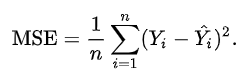  

#### The Root-Mean-Square Error (RMSE)
The RMSE is the square root of the average squared difference between the predicted values and the actual values in a dataset. 
 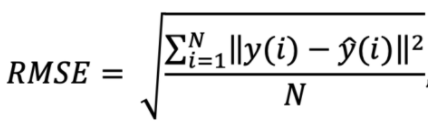

#### the Mean Absolute Error (MAE)
The MAE is a measure of errors between the observed and predicted values  
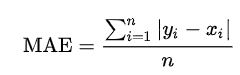  

#### NB1: When assessing how well a model fits a dataset, we use the RMSE more often because it is measured in the same units as the response variable  

#### NB2: The MAE and the RMSE can be used together to diagnose the variation in the errors in a set of forecasts. The RMSE will always be larger or equal to the MAE; the greater difference between them, the greater the variance in the individual errors in the sample. If the RMSE=MAE, then all the errors are of the same magnitude  

#### R-squared (R2)
the **R²** is a statistical measure that represents the goodness-of-fit measure of a predivtive model. This statistic indicates the percentage of the variance in the target (or dependent variable) (y) that the predictors (or independent variables) (xi) explain collectively.  
Whereas correlation explains the strength of the relationship between an independent and dependent variable, R-squared explains to what extent the variance of one variable explains the variance of the second variable. So, if the R² of a model is 0.50, then approximately half of the observed variation can be explained by the model's inputs.  
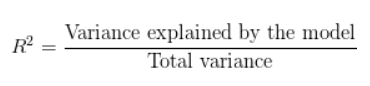

##### Problems with the R-squared
R-squared comes with an inherent problem – additional input variables will make the R-squared stay the same or increase (this is due to how the R-squared is calculated mathematically). Therefore, even if the additional input variables show no relationship with the output variables, the R-squared will increase. An example that explains such an occurrence is provided below.
#### Adjusted R-squared
* The adjusted R-squared is a modified version of R-squared that adjusts for predictors that are not significant in a regression model.  
* Compared to a model with additional input variables, a lower adjusted R-squared indicates that the additional input variables are not adding value to the model.  
* Compared to a model with additional input variables, a higher adjusted R-squared indicates that the additional input variables are adding value to the model.  

see the following link for more detail https://corporatefinanceinstitute.com/resources/knowledge/other/adjusted-r-squared/

In [47]:
from sklearn import metrics
def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R²', r2_square)
    print('__________________________________')

In [48]:
LRpredictions = OLS_results.predict(X_test1)
print_evaluate(y_test, LRpredictions)

MAE: 0.12368606869157991
MSE: 0.023868211159666357
RMSE: 0.15449340167031844
R² 0.9199454778927779
__________________________________


Le coefficient de corrélation ajusté est d'environ 0,92, ce qui est très proche de celui calculé sur les variables d'entraînement, donc à priori le modèle n'est pas biaisé.

In [49]:
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(X_train,y_train)

test_pred = lin_reg.predict(X_test)
train_pred = lin_reg.predict(X_train)

print('Train set evaluation:\n_____________________________________')

print_evaluate(y_train1, train_pred)
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)


Train set evaluation:
_____________________________________
MAE: 0.12216848738265335
MSE: 0.022762059246602222
RMSE: 0.15087100200701997
R² 0.9237350729801921
__________________________________
Test set evaluation:
_____________________________________
MAE: 0.12368606869157969
MSE: 0.023868211159666333
RMSE: 0.1544934016703184
R² 0.919945477892778
__________________________________


En utilisant le module linear_model de sklearn, on trouve des coefficients de corrélation et indicateurs de performance très proches de ceux obtenus avec la méthode OLS, ce qui montre que le modèle est correct.

# Limitations of the linear regression

### Multicollinearity  

Colinearity is the state where two variables are highly correlated. To detect colinearity among variables, simply create a correlation matrix.  

Multicolinearity on the other hand is more troublesome to detect because it emerges when three or more variables, which are highly correlated, are included within a model. It can emerge even when isolated pairs of variables are not colinear.


#### Why is Multicollinearity a Potential Problem?  
One of the main goal of a regression is to determine the relationship between the predictors (xi) and the target variable (y). This consists of analyzing the mean change in the target variable for each 1 unit change in a given feature, when you hold all of the other features constant. When features variables are correlated, the change in one variable is associated with shifts in another variable. Therefore, it becomes difficult for the model to estimate the relationship between each feature variable and the target variable.

#### Multicollinearity causes the following two basic types of problems:  

The coefficient estimates can swing wildly based on which other independent variables are in the model. The coefficients become very sensitive to small changes in the model.  
Multicollinearity reduces the precision of the estimated coefficients, which weakens the statistical power of your regression model. You might not be able to trust the p-values to identify independent variables that are statistically significant.  

see thins link for more details https://statisticsbyjim.com/regression/multicollinearity-in-regression-analysis/  

#### How to detect a multicollinearity? Calculation of the Variance Inflation Factor (VIF) 

The lower precision (std), switched signs, and a lack of statistical significance (p-value) are typical problems associated with multicollinearity. Therefore, analyzing these elements allows to detect multilinearity problem.
  
Variance Inflation Factor (VIF) is a measure of colinearity among predictor variables within a multiple regression. It is calculated by taking the the ratio of the variance of all a given model's betas divide by the variane of a single beta if it were fit alone
$$VIFi = 1 / (1 - Ri^2)$$  
Inspect the factors for each predictor variable, if the VIF is between 5-10, multicolinearity is likely present and you should consider dropping the variable.  

see this link for more details about the VIF 
https://etav.github.io/python/vif_factor_python.html  
https://statisticsbyjim.com/regression/variance-inflation-factors/  

In [50]:
vif = pd.DataFrame()

In [51]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

Let's calculate the VIF for each descriptor variable and add it to the regression result matrix.

In [52]:
vif['VIF Factor'] = [variance_inflation_factor(X_train1, i) for i in range(X_train1.shape[1])]

C:\Users\salom\anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


In [53]:
OLS_results_summary['VIF Factor']=vif['VIF Factor'].round(1).to_list() #add the VIF metric to the result matrix
OLS_results_summary.set_index(variables)

,coef,std err,t,P>|t|,[0.025,0.975],VIF Factor
Constant,1.6042,0.030,53.529,0.000,1.545,1.663,54.9
Speedometer Dial position_behind steering wheel,-0.7893,0.023,-34.856,0.000,-0.834,-0.745,7.5
Display lay-out_digital,0.4821,0.019,25.558,0.000,0.445,0.519,4.5
Air conditioner control_other,-0.1590,0.015,-10.374,0.000,-0.189,-0.129,3.1
Air vent shape_square,-0.0367,0.009,-4.149,0.000,-0.054,-0.019,inf
Dashboard color_two colours,0.3940,0.015,25.672,0.000,0.364,0.424,3.5
Aerator Shape_square,-0.0367,0.009,-4.149,0.000,-0.054,-0.019,inf
Arrangement space_many,-0.2505,0.022,-11.410,0.000,-0.294,-0.207,7.4
Style lay-out_curved lines,-0.0411,0.018,-2.241,0.025,-0.077,-0.005,5.1


Plusieurs couples de variables ont un VIF compris entre 5 et 10 donc à priori il y a des multicolinéarité dans le modèle.

## The overfitting problem

Overfitting is when your model has over-trained itself on the data that is fed to train it. It could be because there are too many features in the data or because we have not supplied enough data. It happens when the difference between the actual and predicted values is close to 0.  

In the example below, a sine curve was simulated and some random noise was added. 

15 new features were created: powers of x from 1 to 15. xi = x^i (example: x3=x^3)  
Let’s make 15 different linear regression models SINi=constant + beta Xi, with each model containing variables with powers of x from 1 to the particular model number. For example, the feature set of model 8 will be {x, x^2, x^3, … ,x^8}.
the resultas are displayed in the following graph


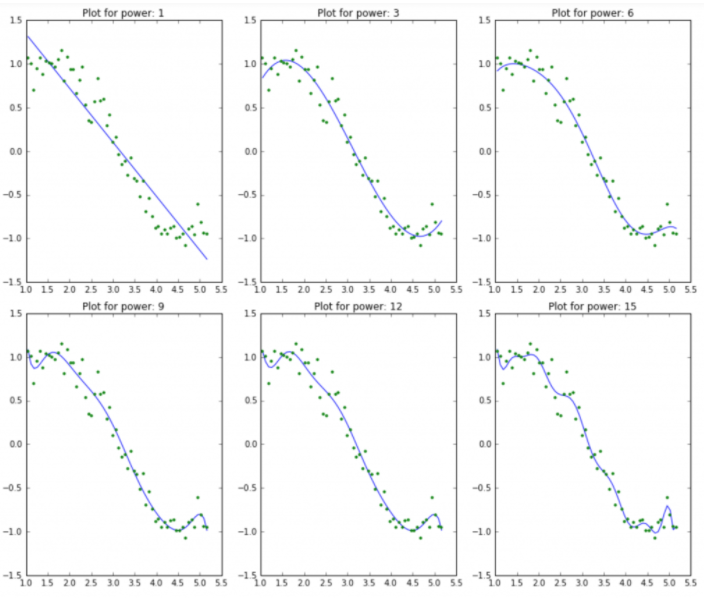 



Two extreme situations could be faced:  
1- A Straight Line is fitted (plot for power 1): this means that the algorithm has a very strong pre-conception of the data (linear assumption). It implies that it has high-bias. This is known as under-fitting. These models are not good for predicting new data.  

2- A Very Strong Closely Fitted Line (plot for power 15): This is the other extreme. It might look as if it’s doing a great job at predicting the stock price. However, this is known as over-fitting. It is also known as high-variance because it has learned the training data so well that it cannot generalise well to make predictions on new and unseen data. These models are not good for predicting new data  
Plot 3 seems to be the best model for the sin curve.

## The causes of overfitting

### High number of predictors  
As noted above, as the model complexity (i.e. the number of predictors) increases, the models tends to fit even smaller deviations in the training data set. Though this leads to overfitting.  
The table below provides the coefficients related to the predictors in each model.  
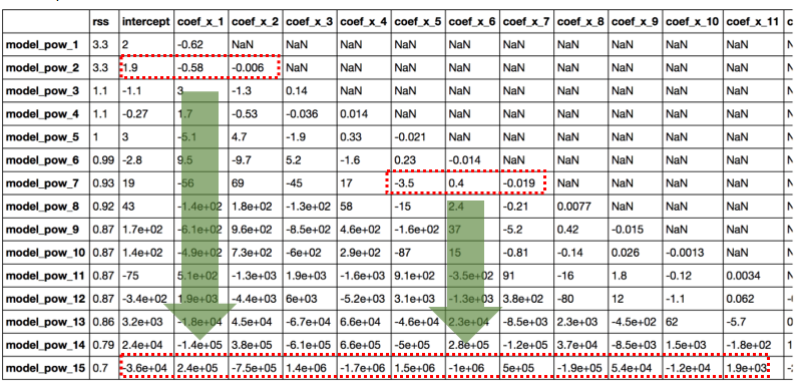  

We can note that the values of coefficients increase exponentially with increase in model complexity.  
As an impact, the model becomes very sensitive to inputs and possibly unstable (a little variation of the feature engenders high variation of the target variable). This is particularly true for problems with few observations (samples) and high number of  predictors (p) or variables (p > n ).  
See the example and the script in this link https://www.analyticsvidhya.com/blog/2016/01/ridge-lasso-regression-python-complete-tutorial/  


### How could we detect Over-fitting?  
The models that have been over-fitted on the training data do not generalise well to new examples. They are not good at predicting unseen data.  
This implies that they are extremely accurate during training and yield very poor results during the prediction of unseen data.
If the measure of accuracy such as Mean Error Squared (MSE) is substantially lower during training of the model and the accuracy deteriorates on the test data set then it implies that your model is over-fitting the data. 
The following lines allows the comparison of the model performances obtained with the trained data and tet data.

In [54]:
test_pred = lin_reg.predict(X_test)
train_pred = lin_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train1, train_pred)

Test set evaluation:
_____________________________________
MAE: 0.12368606869157969
MSE: 0.023868211159666333
RMSE: 0.1544934016703184
R² 0.919945477892778
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.12216848738265335
MSE: 0.022762059246602222
RMSE: 0.15087100200701997
R² 0.9237350729801921
__________________________________


### How to fix over-fitting and multi-colinearity issues  
 
#### 1. Reduce Features:
The most obvious option is to reduce the features. You can compute the correlation matrix of the features as well as the VIF metric and reduce the features that are highly correlated with each other.
#### 2. Model Selection Algorithms:
You can select model selection algorithms. These algorithms can choose features with greater importance.
#### 3. Feed More Data: 
you should aim to feed enough data to your models so that the models are trained, tested and validated thoroughly. Aim to give 60% of the data to train the model, 20% of the data to test and 20% of the data to validate the model.
#### 4. Regularization:
The aim of regularization is to keep all of the features but impose a constraint on the magnitude of the coefficients.  
The regularization parameters, known as penalty factors, are introduced which control the parameters and ensure that the model is not over-training itself on the training data.
These parameters are set to smaller values to eliminate overfitting. When the coefficients take large values then the regularization parameters penalize the optimization function.
There are 3 common regularization techniques that will be prensented below:  
1- RIDGE regression  
2- LASSO regression  
3- ELASTIC NET regression  

see this tutorial about Ridge and Lasso Regressions https://www.analyticsvidhya.com/blog/2016/01/ridge-lasso-regression-python-complete-tutorial/  
https://www.datacamp.com/community/tutorials/tutorial-ridge-lasso-elastic-net  

### Ridge Regression 

Ridge Regression consists of adding a penalty function to the cost function of the OLS regression to be minimized. This penality function is based on the sum of the squared coefficient values. This is called an L2 penalty. Ridge Regression penalizes the high coefficients, and thereby enforces them to be small in a continuous way. This way, we decrease model complexity while keeping all variables in the model.  

   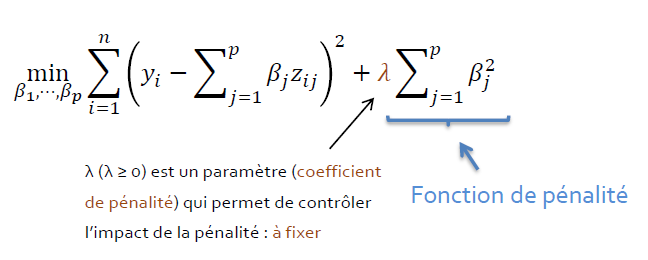

#### Determine the Hyperparameters λ
There are two ways to define the adequate value of λ. A more traditional approach would be to choose λ such that some information criterion, e.g. MSE (Minimum Square Error) is the smallest. The scikit-learn Python machine learning library provides an implementation of the Ridge Regression algorithm via the Ridge class.

Confusingly, the lambda term can be configured via the “alpha” argument when defining the class. The default value is 1.0 or a full penalty.


In [55]:
from sklearn.linear_model import Ridge

model = Ridge(alpha=1)
model.fit(X_train, y_train)
pred = model.predict(X_test)

test_pred = model.predict(X_test)
train_pred = model.predict(X_train)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)
print('====================================')
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)



Train set evaluation:
_____________________________________
MAE: 0.12223681512093322
MSE: 0.02277591538753829
RMSE: 0.15091691551160955
R² 0.923688647585819
__________________________________
Test set evaluation:
_____________________________________
MAE: 0.12378607356034953
MSE: 0.023928250834056655
RMSE: 0.15468759107975227
R² 0.9197441034617979
__________________________________


#### Tuning Ridge Hyperparameters

How do we know that the default hyperparameters of alpha=1.0 is appropriate for our dataset?  
We don’t! 

A more machine learning-like approach is to perform cross-validation and select the value of alpha that minimizes the cross-validated sum of squared residuals (or some other measure). 

The scikit-learn library provides a built-in version of the algorithm that automatically finds good hyperparameters via the RidgeCV class.  

To use this class, it is fit on the training dataset and used to make a prediction. During the training process, it automatically tunes the hyperparameter values.  

By default, the model will only test the alpha values (0.1, 1.0, 10.0). We can change this to a grid of values between 0 and 1 with a separation of 0.01 by setting the “alphas” argument.  

The example below demonstrates this.

In [73]:
# use automatically configured the ridge regression algorithm
from numpy import arange
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import RepeatedKFold
# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# define model
model = RidgeCV(alphas=arange(0.000000000001, 1, 0.01), cv=cv, scoring='neg_mean_absolute_error')
# fit model
model.fit(X_train, y_train)
# summarize chosen configuration
print('alpha: %f' % model.alpha_)

alpha: 0.000000


According to the optmization above, the adequate value of alpha is 0.99.  
Let's built the model using alpha: 0.99 and check the improvement on the performance metrics.
We can not that the MSE decreases little bit

In [74]:
from sklearn.linear_model import Ridge

model = Ridge(alpha=0.01)
model.fit(X_train, y_train)
pred = model.predict(X_test)

test_pred = model.predict(X_test)
train_pred = model.predict(X_train)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)
print('====================================')
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)

Train set evaluation:
_____________________________________
MAE: 0.12216864467383183
MSE: 0.022762060731044993
RMSE: 0.15087100692659605
R² 0.9237350680065244
__________________________________
Test set evaluation:
_____________________________________
MAE: 0.1236863976779116
MSE: 0.023868699805549023
RMSE: 0.1544949831080253
R² 0.9199438389633938
__________________________________


In [76]:
print(pd.DataFrame({'Variables':data.columns[:-1],'Coefficients':model.coef_}))

ValueError: All arrays must be of the same length

### LASSO Regression (Least Absolute Shrinkage and Selection Operator)

Lasso is a second popular type of regularized linear regression that includes an L1 penalty.  
It is quite similar conceptually to ridge regression in the sense that it also adds a penalty for non-zero coefficients, but unlike ridge regression which penalizes sum of squared coefficients (the so-called L2 penalty), lasso penalizes the sum of their absolute values (L1 penalty). This has the effect of shrinking the coefficients for those input variables that do not contribute much to the prediction task. For high values of λ, this penalty allows some coefficient values to go to the value of zero, allowing input variables to be effectively removed from the model, providing a type of automatic feature selection.  


Under lasso, the loss function is defined as:  
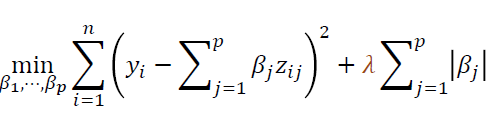  



The scikit-learn Python machine learning library provides an implementation of the Lasso penalized regression algorithm via the Lasso class.  
Confusingly, the lambda term can be configured via the “alpha” argument when defining the class. The default value is 1.0 or a full penalty.  

In [77]:
from sklearn.linear_model import Lasso

model = Lasso(alpha=1)
model.fit(X_train, y_train)

test_pred = model.predict(X_test)
train_pred = model.predict(X_train)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)
print('====================================')
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)

Train set evaluation:
_____________________________________
MAE: 0.4640409791605796
MSE: 0.29846038193533364
RMSE: 0.5463152770473599
R² 0.0
__________________________________
Test set evaluation:
_____________________________________
MAE: 0.4670176664723524
MSE: 0.299404619812662
RMSE: 0.5471787823122001
R² -0.004209892205939925
__________________________________


We can not that the model performance is very bad (MSE, R²...).

In [79]:
print(pd.DataFrame({'Variables':data.columns[:-1],'Coefficients':model.coef_}))

ValueError: All arrays must be of the same length

The scikit-learn library also provides a built-in version of the algorithm that automatically finds good hyperparameters via the LassoCV class.  

To use the class, the model is fit on the training dataset as per normal and the hyperparameters are tuned automatically during the training process. The fit model can then be used to make a prediction.  

By default, the model will test 100 alpha values. We can change this to a grid of values between 0 and 1 with a separation of 0.01 by setting the “alphas” argument.  

The example below demonstrates this

In [80]:
# use automatically configured the lasso regression algorithm
from numpy import arange
from pandas import read_csv
from sklearn.linear_model import LassoCV
from sklearn.model_selection import RepeatedKFold
import warnings
warnings.filterwarnings("ignore")

# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# define model
model = LassoCV(alphas=arange(0, 1, 0.01), cv=cv, n_jobs=-1)
# fit model
model.fit(X_test, y_test)
# summarize chosen configuration
print('alpha: %f' % model.alpha_)

alpha: 0.000000


Let's built the model using alpha: 0.040000 and check the improvement on the performance metrics.  
We can not that the MSE decreases from 1.37 to 0.33 and the R² increases from 0 to 0.77. a little improvement was also reached compared to the OLS model.

In [81]:
model = Lasso(alpha=0.04)
model.fit(X_train, y_train)

test_pred = model.predict(X_test)
train_pred = model.predict(X_train)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)
print('====================================')
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)

Train set evaluation:
_____________________________________
MAE: 0.16188745903452517
MSE: 0.043141723910544015
RMSE: 0.20770585911462394
R² 0.8554524267817516
__________________________________
Test set evaluation:
_____________________________________
MAE: 0.16272430271609173
MSE: 0.04396476325884929
RMSE: 0.20967776052516704
R² 0.85254118590203
__________________________________


### Use LASSO regression to select main predictors

In [82]:
my_alphas = np.array([0.001,0.01,0.02,0.025,0.05,0.1,0.25,0.5,0.8,1.0])

In [83]:
from sklearn.linear_model import lasso_path
alpha_for_path, coefs_lasso, _ = lasso_path(X_train,y_train,alphas=my_alphas)

In [84]:
print('The coefficients matrix dimension:')
print(coefs_lasso.shape)
print('The used alphas are:')
print(alpha_for_path)

The coefficients matrix dimension:
(8, 10)
The used alphas are:
[1.    0.8   0.5   0.25  0.1   0.05  0.025 0.02  0.01  0.001]


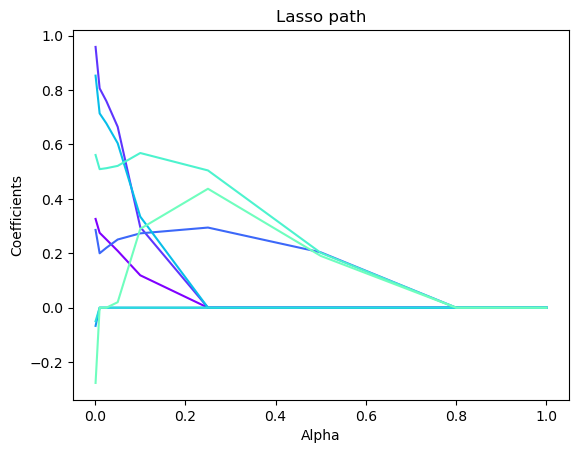

In [85]:
import matplotlib.cm as cm
couleurs = cm.rainbow(np.linspace(0,1,16))

for i in range(coefs_lasso.shape[0]):
    plt.plot(alpha_for_path,coefs_lasso[i,:],c=couleurs[i])
    
plt.xlabel('Alpha')
plt.ylabel('Coefficients')
plt.title('Lasso path')
plt.show()


##### Non zero coeff for each alpha 

In [88]:
nbNonZero = np.apply_along_axis(func1d=np.count_nonzero,arr=coefs_lasso,axis=0)
print(pd.DataFrame({'alpha':alpha_for_path,'Nb non-zero coefs':nbNonZero}))

   alpha  Nb non-zero coefs
0  1.000                  0
1  0.800                  0
2  0.500                  3
3  0.250                  3
4  0.100                  6
5  0.050                  6
6  0.025                  5
7  0.020                  5
8  0.010                  5
9  0.001                  8


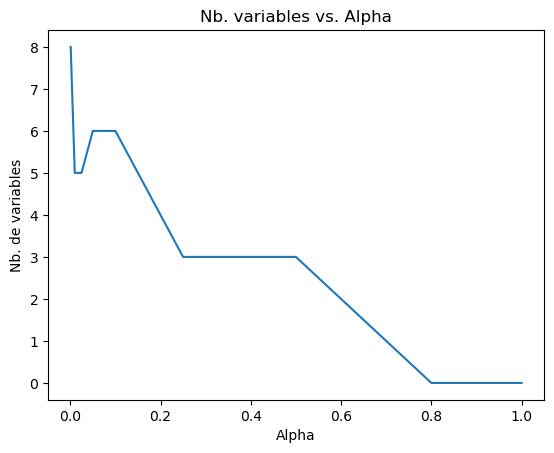

In [89]:
plt.plot(alpha_for_path,nbNonZero)
plt.xlabel('Alpha')
plt.ylabel('Nb. de variables')
plt.title('Nb. variables vs. Alpha')
plt.show()

##### alpha=0.25 (Third column) 

In [91]:
coefs25 = coefs_lasso[:,3]
print(pd.DataFrame({'Variables':data.columns[:-1],'Coefficients':coefs25}))

ValueError: All arrays must be of the same length

### Comparison Ridge vs. Lasso

Some more general considerations about how ridge and lasso compare:

* Often neither one is overall better.  
* Lasso can set some coefficients to zero, thus performing variable selection, while ridge regression cannot.
* Both methods allow to use correlated predictors, but they solve multicollinearity issue differently:
    - In ridge regression, the coefficients of correlated predictors are similar;
    - In lasso, one of the correlated predictors has a larger coefficient, while the rest are (nearly) zeroed.
* Lasso tends to do well if there are a small number of significant parameters and the others are close to zero (ie. when only a   few predictors actually influence the response).
* Ridge works well if there are many large parameters of about the same value (ie. when most predictors impact the response).
* However, in practice, we don't know the true parameter values, so the previous two points are somewhat theoretical. Just run *    cross-validation to select the more suited model for a specific case.
* Or... combine the two!

### Elastic Net 

Elastic Net consists of combining the penalties of ridge regression and lasso to get the best of both worlds. Elastic Net aims at minimizing the following loss function:  
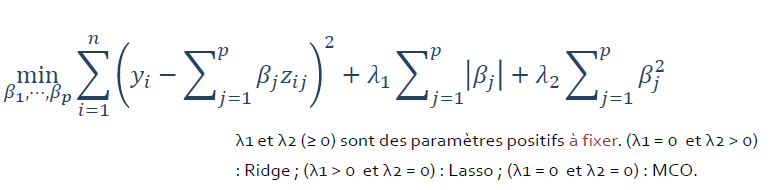  
 could be written as follow:  
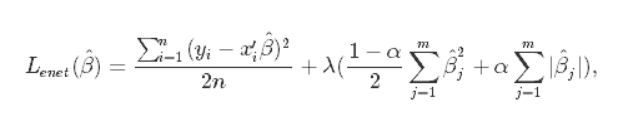  
where α is the mixing parameter between ridge (α = 0) and lasso (α = 1).


Confusingly, the alpha hyperparameter can be set via the “l1_ratio” argument that controls the contribution of the L1 and L2 penalties and the lambda hyperparameter can be set via the “alpha” argument that controls the contribution of the sum of both penalties to the loss function.  

The scikit-learn Python machine learning library provides an implementation of the Elastic Net penalized regression algorithm via the ElasticNet class.

Confusingly, the alpha hyperparameter can be set via the “l1_ratio” argument that controls the contribution of the L1 and L2 penalties and the lambda hyperparameter can be set via the “alpha” argument that controls the contribution of the sum of both penalties to the loss function.

By default, an equal balance of 0.5 is used for “l1_ratio” and a full weighting of 1.0 is used for alpha.

In [92]:
#define the model
from sklearn.linear_model import ElasticNet

model = ElasticNet(alpha=1, l1_ratio=0.5)
model.fit(X_train, y_train)

ElasticNet(alpha=1)

In [93]:
test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

print('====================================')

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)



Train set evaluation:
_____________________________________
MAE: 0.4640409791605796
MSE: 0.29846038193533364
RMSE: 0.5463152770473599
R² 0.0
__________________________________
Test set evaluation:
_____________________________________
MAE: 0.4670176664723524
MSE: 0.299404619812662
RMSE: 0.5471787823122001
R² -0.004209892205939925
__________________________________


### Tuning Elastic Net Hyperparameters

How do we know that the default hyperparameters of alpha=1.0 and l1_ratio=0.5 are any good for our dataset?  

We don’t.  

Instead, it is good practice to test a suite of different configurations and discover what works best.  

One approach would be to gird search l1_ratio values between 0 and 1 with a 0.1 or 0.01 separation and alpha values from perhaps 1e-5 to 100 on a log-10 scale and discover what works best for a dataset.  

The scikit-learn library also provides a built-in version of the algorithm that automatically finds good hyperparameters via the ElasticNetCV class.  

To use this class, it is first fit on the dataset, then used to make a prediction. It will automatically find appropriate hyperparameters.  

By default, the model will test 100 alpha values and use a default ratio. We can specify our own lists of values to test via the “l1_ratio” and “alphas” arguments.  

The example below demonstrates this  

In [94]:
# use automatically configured elastic net algorithm
from numpy import arange
from sklearn.linear_model import ElasticNetCV
from sklearn.model_selection import RepeatedKFold
# define model evaluation method: cv=cross-validation
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# define model
ratios = arange(0, 1, 0.01)
alphas = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.0, 1.0, 10.0, 100.0]
model = ElasticNetCV(l1_ratio=ratios, alphas=alphas, cv=cv, n_jobs=-1)
# fit model
model.fit(X_test, y_test)
# summarize chosen configuration
print('alpha: %f' % model.alpha_)
print('l1_ratio_: %f' % model.l1_ratio_)

alpha: 0.000100
l1_ratio_: 0.000000


Let's test the configuration proposed by the script above, i.e. alpha = 0.1 and l&_raito = 0.55.
we can not in the results below that the MSE decreased from 0.7 to 0.31 and the R² increases from 0.3 to 0.76

In [95]:
model = ElasticNet(alpha=0.1, l1_ratio=0.55)
model.fit(X_train, y_train)

test_pred = model.predict(X_test)
train_pred = model.predict(X_train)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)
print('====================================')
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)



Train set evaluation:
_____________________________________
MAE: 0.20757411418082353
MSE: 0.06943389085818051
RMSE: 0.26350311356449
R² 0.7673597734883805
__________________________________
Test set evaluation:
_____________________________________
MAE: 0.20728963452378074
MSE: 0.07026425652440006
RMSE: 0.2650740585655263
R² 0.764332088414508
__________________________________


# Cross validation 

see the following link for more details (K-Folds method)  
https://datascientest.com/cross-validation  
https://stats.stackexchange.com/questions/69549/lasso-cross-validation

In [96]:
from sklearn.model_selection import cross_val_score

def cross_val(model):
    pred = cross_val_score(model, X, y, cv=10)
    return pred.mean()
def evaluate(true, predicted):
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    return mae, mse, rmse, r2_square

In [97]:
final_results = pd.DataFrame()

#### Cross validation and results for OLS 

In [98]:
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train,y_train)

TypeError: LinearRegression.__init__() got an unexpected keyword argument 'normalize'

In [ ]:
temp_results = pd.DataFrame(data=[["Linear Regression", *evaluate(y_test, test_pred) , cross_val(LinearRegression())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
final_results = final_results.append(temp_results, ignore_index=True)
final_results

#### Cross validation and results for Ridge

In [99]:
temp_results = pd.DataFrame(data=[["Ridge Regression", *evaluate(y_test, test_pred) , cross_val(Ridge())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
final_results = final_results.append(temp_results, ignore_index=True)
final_results

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Ridge Regression,0.20729,0.070264,0.265074,0.764332,-2.207902


#### Cross validation and results for Lasso

In [100]:
temp_results = pd.DataFrame(data=[["Lasso Regression", *evaluate(y_test, test_pred) , cross_val(Lasso())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
final_results = final_results.append(temp_results, ignore_index=True)
final_results

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Ridge Regression,0.20729,0.070264,0.265074,0.764332,-2.207902
1,Lasso Regression,0.20729,0.070264,0.265074,0.764332,-18.488276


#### Cross validation and results for ElasticNet

In [101]:
results_df_2 = pd.DataFrame(data=[["Elastic Net Regression", *evaluate(y_test, test_pred) , cross_val(ElasticNet())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
final_results = final_results.append(results_df_2, ignore_index=True)
final_results

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Ridge Regression,0.20729,0.070264,0.265074,0.764332,-2.207902
1,Lasso Regression,0.20729,0.070264,0.265074,0.764332,-18.488276
2,Elastic Net Regression,0.20729,0.070264,0.265074,0.764332,-18.488276


# Case of qualitative variables

Categorical variables (also known as factor or qualitative variables) are variables that classify observations into groups. They have a limited number of different values, called levels. For example the gender of individuals are a categorical variable that can take two levels: Male or Female.

Regression analysis requires numerical variables. So, when we wish to include a categorical variable in a regression model, supplementary steps are required to make the results interpretable.

In these steps, the categorical variables are recoded into a set of separate binary variables. This recoding is called “dummy coding” and leads to the creation of a table called contrast matrix. 
the example used here was extracted from this link: https://medium.com/analytics-vidhya/implementing-linear-regression-using-sklearn-76264a3c073c

## Import the required libraries and the dataset

In [102]:
# import the required libraries
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [103]:
#Import data
df=df = pd.read_excel('Multiple_variable.xlsx',sheet_name='Sheet2')

#display the first 5 raws
df.head()

FileNotFoundError: [Errno 2] No such file or directory: 'Multiple_variable.xlsx'

## Exploratory Analysis

In [ ]:
df.shape
df.describe()

From the above output, we will try to see the nature of the dataset: is dataset  following normal distribution or not? or is the dataset is noisy, in this scenario we will see the trend column-wise?
So for that, we will observe the values of Mean, Std, Min, Median(median represents the 50th percentile or the middle value of the data), and Max

In [104]:
df.dtypes

NameError: name 'df' is not defined

In [105]:
sns.pairplot(df,hue='Gender')

NameError: name 'df' is not defined

From the above graph, we notice that Salary is directly proportional to Years of Experience and age.
For more details, let's look at the below graph :

In [ ]:
sns.pairplot(df,x_vars=['Age','YearsExperience'],y_vars=['Salary'],hue='Gender')

In [ ]:
df.corr()

Here we can see Age and Years of Experience both are correlated with Salary.

In [ ]:
sns.heatmap(df.corr(),annot=True,lw=1)

the box plot below allows to see the trend between two variables you can see with 

In [ ]:
sns.boxplot(y='Age',x='Gender',data=df)

In [ ]:
sns.boxplot(y='Salary',x='Classification',data=df)

## Recode the quanlitative variables into binary variables

After doing all analysis, we understand we have some categorical variables as well, so we need to add dummy variables!
### What is a Dummy Variable?
A dummy variable (is, an indicator variable) is a numeric variable that represents categorical data, such as gender, race, etc.
### What are the benefits of a Dummy Variable?
Regression results are easiest to interpret when dummy variables are limited to two specific values, 1 or 0. Typically, 1 represents the presence of a qualitative attribute, and 0 represents the absence.
so our independent variables would be

In [ ]:
X = df[['Age', 'YearsExperience', 'Gender', 'Classification', 'Job']]
X.head()

In the above data frame, we have Gender, Classification, and Job as a categorical variable, so we need to add dummy variables instead

## Recode the quanlitative variables into binary variables

In [ ]:
X = pd.get_dummies(data=X, drop_first=True)
X.head()

above code added the dummy variable in form of 0 and 1, which is easy to interpret for the regression model.

In [ ]:
Y = df['Salary']
Y.head(5)

### Creating a train and test dataset

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.4, random_state=101)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

After splitting the dataset into a test and train we will be importing the Linear Regression model

In [ ]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train,y_train)

In [ ]:
# print the intercept
print(model.intercept_)

The intercept (often labeled the constant) is the expected mean value of Y when all X=0. In a purely mathematical sense, this definition is correct. Unfortunately, it’s frequently impossible to set all variables to zero because this combination can be an impossible or irrational arrangement.

In [ ]:
coeff_parameter = pd.DataFrame(model.coef_,X.columns,columns=['Coefficient'])
coeff_parameter

Another way to display the cosntant (precept) and the coefficients

In [ ]:
#import the statsmodels library
import statsmodels.api as sm
# fit a model
X_train_Sm= sm.add_constant(X_train)
OLS_categ_model=sm.OLS(y_train,X_train_Sm).fit()

#display the model coefficients
variables =X.columns.insert(0, 'Constant')
OLS_categ_coeff = pd.DataFrame({'Coef': OLS_categ_model.params})
OLS_categ_coeff.set_index(variables)

In [ ]:
predictions = model.predict(X_test)
print(pd.DataFrame({'Salary Predictions':predictions}))

In [ ]:
sns.regplot(y_test,predictions)

The above graph shows our model is predicting good results. lets see Rsquare value

#### display the models parameters sumary

In [ ]:
print(OLS_categ_model.summary())

# Examples, with GIF animations
in the link below, GIF animatins are given to illustrate the difference between several algorithms of Machine Learning, including regression, decision trees, ...  
https://paulvanderlaken.com/2020/01/20/animated-machine-learning-classifiers/